In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from DataLoader import *
import datetime
import random
import warnings
from BehaviourFeatureExtractor import *
from BehaviourAnnotation import *
from VocalFeatureExtractor import *
from colour import Color
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import copy
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings

# Data loading #

In [2]:
annotated_resolved_processed_data_dir = "./annotated_cleaned_resolved_data"
data_dir = "./data"
DL = DataLoader(data_dir, "config.json")
BA = BehaviourAnnotator("config.json")
BF = BehaviourFeatureExtractor("config.json")
mouse_ids = [name for name in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, name)) and (name.startswith("M") or name.startswith("V"))]
days = [f"d{i}" for i in range(1, 7)]

print(mouse_ids)
print(days)

['MBQ0231R', 'MBI5336LL', 'MBQ0012RR', 'MBI5335RR', 'VBQ0253LL', 'VAC0143LLR', 'VBQ0261L', 'MBI3793R']
['d1', 'd2', 'd3', 'd4', 'd5', 'd6']


In [3]:
annotated_resolved_processed_data_dict = load_processed_data(annotated_resolved_processed_data_dir, mouse_ids, days)

# Visualization of USVs over approach #

In [ ]:
for mouse_id in mouse_ids:
    for day in days:
        for trial_num in annotated_resolved_processed_data_dict[mouse_id][day]["trials"]:

            trial_data = copy.deepcopy(annotated_resolved_processed_data_dict[mouse_id][day]["trials"][trial_num]["dlc_data"])
            df_summary = copy.deepcopy(annotated_resolved_processed_data_dict[mouse_id][day]["Behavior"]["df_summary"])
            pup_locations = copy.deepcopy(annotated_resolved_processed_data_dict[mouse_id][day]["trials"][trial_num]["pup_locations"])

            BA.plot_behavioral_annotations(trial_data, df_summary, pup_locations,
                                        mouse_id, day, trial_num, add_USV_plot = True,
                                        add_head_angle_to_pup_plot = False, export_plot = True, plot_dir = "usv_annotated_trials")   


# Correlation plots over sessions #

### Helper function for extracting appropriate trial window from processed data ###

In [4]:
def extract_trial_window(experiment_data, ms_id, d, trial_num, BF_instance, pre_event_window_size_time = 10):
    """ Extracts the pre-trial window for a given trial, considering available and valid pup locations given the pup locations information"""
    
    df_summary = copy.deepcopy(experiment_data[ms_id][d]["Behavior"]["df_summary"])
    trial_DLC = copy.deepcopy(experiment_data[ms_id][d]["trials"][trial_num]["dlc_data"])
    pup_locations = copy.deepcopy(experiment_data[ms_id][d]["trials"][trial_num]["pup_locations"])

    trial_pickup_time = df_summary.loc[df_summary[BF_instance.DLC_summary_cols["trial_num"]] == trial_num,
                                       BF_instance.DLC_summary_cols["mouse_first_pick_up"]].values[0]
    
    # find the pup_location_id of "pickup" = "after", this gives the pre-pickup pup_location
    pre_pickup_pup_location_id = [key for key, value in pup_locations.items() if value["pickup"] == "after" or value["pickup"]== "included"][0] 
    trial_start_time =  pup_locations[pre_pickup_pup_location_id]["start_time"] # get the start_time and end_time of the pup_location

    # conversion to minutes string
    trial_pickup_time_minutes = f"{int(trial_pickup_time//60)}m:{int(trial_pickup_time%60)}s"
    trial_start_time_minutes = f"{int(trial_start_time//60)}m:{int(trial_start_time%60)}s"

    start_window = max(trial_start_time, trial_pickup_time - pre_event_window_size_time)
    end_window = trial_pickup_time
    mask_window = (trial_DLC["time_seconds"] >= start_window) & (trial_DLC["time_seconds"] <= end_window)
    window = trial_DLC[mask_window].copy()

    columns = [BF_instance.DLC_behaviour_cols["mouse_speed"], BF_instance.DLC_behaviour_cols["distance_mouse_pup"], BF_instance.DLC_behaviour_cols["distance_head_pup"]]
    px_cm_ratio = BF_instance.config["pixels_to_cm_ratio"]
    for col in columns:
        window[col+"_cm"] = window[col] / px_cm_ratio
 
    window[BF_instance.DLC_cols["time"]] = window[BF_instance.DLC_cols["time"]] - window[BF_instance.DLC_cols["time"]].iloc[-1]

    return window


### Finding suitable files ###

We want to find trials that have a valid pickup point marked by the BehaviorSummary .csv file. Trials can be failed or successful.

No pick up point for trial 2
No pick up point for trial 1
No pick up point for trial 5
MBQ0231R Day d1 - Trial 4 was not successful
No pick up point for trial 3
No pick up point for trial 4
No pick up point for trial 7
No pick up point for trial 8
No pick up point for trial 2
MBQ0231R Day d3 - Trial 4 was not successful
MBQ0231R Day d3 - Trial 1 was not successful
MBQ0231R Day d3 - Trial 9 was not successful
MBQ0231R Day d5 - Trial 1 was not successful
No pick up point for trial 1
No pick up point for trial 7
MBI5336LL Day d1 - Trial 1 was not successful
No pick up point for trial 6
MBI5336LL Day d1 - Trial 2 was not successful
No pick up point for trial 5
No pick up point for trial 3
No pick up point for trial 4
MBI5336LL Day d2 - Trial 9 was not successful
No pick up point for trial 3
No pick up point for trial 7
No pick up point for trial 10
MBI5336LL Day d2 - Trial 6 was not successful
MBI5336LL Day d2 - Trial 8 was not successful
MBI5336LL Day d3 - Trial 8 was not successful
MBI53

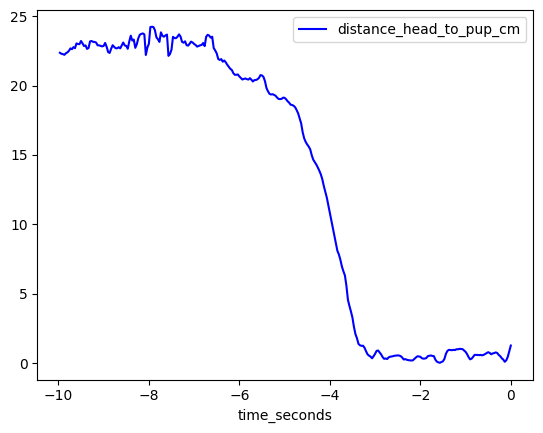

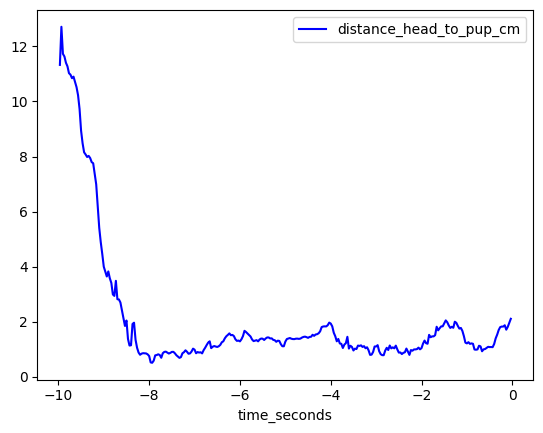

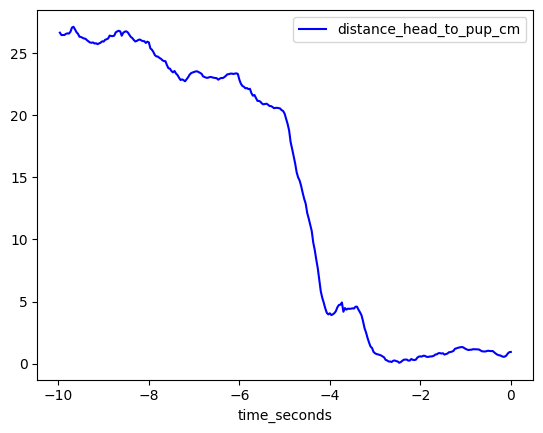

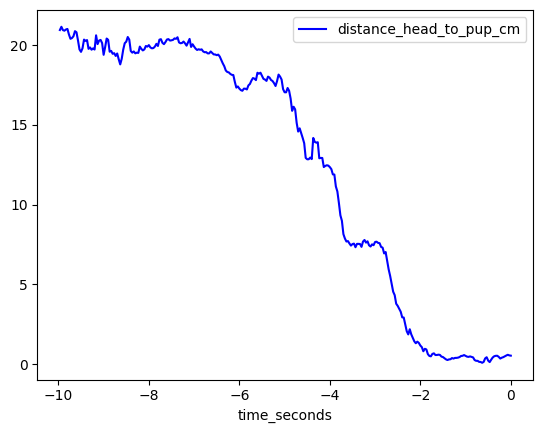

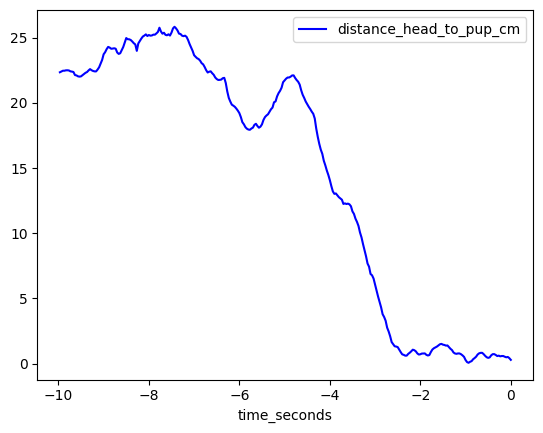

...

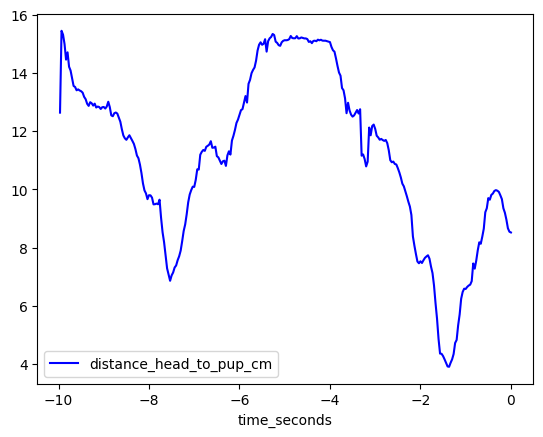

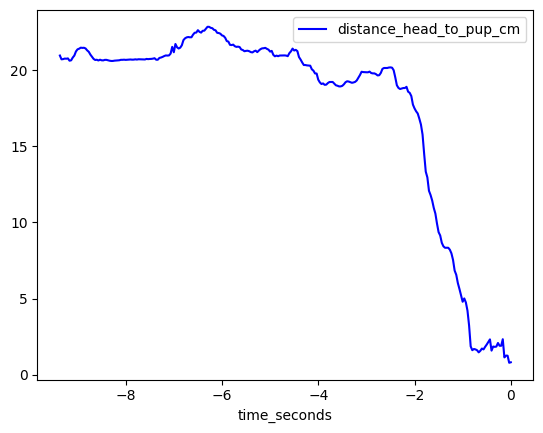

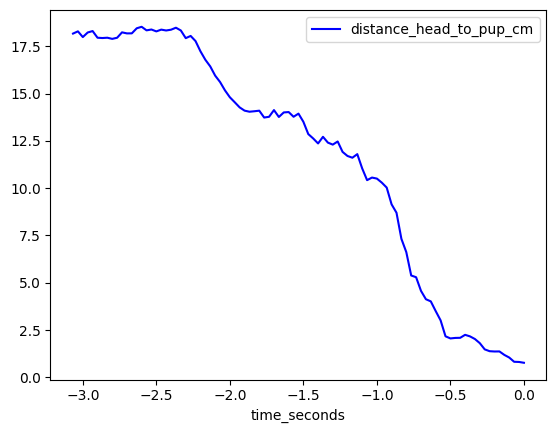

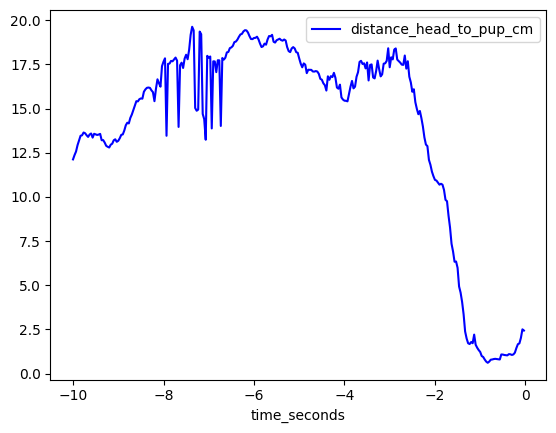

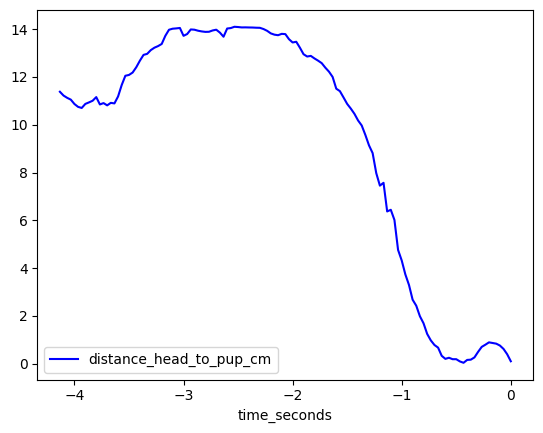

In [5]:
complex_trials = []
successful_trials = []
no_pick_up = []
failed_with_pick_up = []

for ms_id in mouse_ids:
    for d in days:
        for trial_num in annotated_resolved_processed_data_dict[ms_id][d]["trials"].keys():

            df_summary = annotated_resolved_processed_data_dict[ms_id][d]["Behavior"]["df_summary"].copy()
            trial_pickup_time = df_summary.loc[df_summary[BF.DLC_summary_cols["trial_num"]] == trial_num, BF.DLC_summary_cols["mouse_first_pick_up"]].values[0]
            trial_success =  df_summary.loc[df_summary[BF.DLC_summary_cols["trial_num"]] == trial_num, BF.DLC_summary_cols["trial_success"]].values[0]

            if trial_success == 1:
                successful_trials.append((ms_id, d, trial_num))
                window = extract_trial_window(annotated_resolved_processed_data_dict, ms_id, d, trial_num, BF)
                window.plot(x = BF.DLC_cols["time"], y = "distance_head_to_pup_cm", color = "blue")

            if np.isnan(trial_pickup_time):
                print("No pick up point for trial", trial_num)
                no_pick_up.append((ms_id, d, trial_num))

            elif (ms_id, d, trial_num) in complex_trials:
                print(f"{ms_id} Day {d} - Trial {trial_num} is too complex")

            elif trial_success == 0:
                print(f"{ms_id} Day {d} - Trial {trial_num} was not successful")
                failed_with_pick_up.append((ms_id, d, trial_num))


Showing counts of pick-up trials:

In [7]:
# count of sucessful trials
print("Virgin success trials count:", len([t for t in successful_trials if t[0].startswith("V")]))
print("Mother success trials count:", len([t for t in successful_trials if t[0].startswith("M")]))

# count of failed trials with attempted pick up
print("Virgin failed trials (with pick up) count:", len([t for t in failed_with_pick_up if t[0].startswith("V")]))
print("Mother failed trials (with pick up) count:", len([t for t in failed_with_pick_up if t[0].startswith("M")]))

Virgin success trials count: 78
Mother success trials count: 166
Virgin failed trials (with pick up) count: 19
Mother failed trials (with pick up) count: 57


### Collecting values from trial data ###

#### 1. Current time correlation ####

We extract within bin values counts of USV properties (average power, frequency, duration, total number of calls) and average distance to pup.

In [13]:
def extract_correlation_data_current_bin(experiment_data, trials, time_bins, input_variables, dependent_variable, days, BF):
    bounds = {key: {"min": None, "max": None}
              for key in input_variables + dependent_variables}

    correlation_data = { category: { key: {day:[] for day in days} 
                                 for key in input_variables }
                        for category in ["Mother", "Virgin"]}

    experiment_data = copy.deepcopy(experiment_data)

    for t in trials:
        # extract window
        df = extract_trial_window(experiment_data, *t, BF)

        ms_id, session, trial_num = t

        for b in time_bins:

            min_b, max_b = b
            mask = (df["time_seconds"] >= min_b) & (df["time_seconds"] <= max_b)
            window_bin = df[mask]

            if window_bin["time_seconds"].sum() == 0:
                length = df["time_seconds"].iloc[0]
                print(f"Bin {b} is empty, trial too short with total length {length} seconds")
                continue

            else:
                groups = window_bin.groupby("bout_window_index")

                # aggregating call numbers over groups
                call_numbers = [g["call_number"].iloc[0] for name, g in groups if g["call_number"].isna().sum() == 0]
                total_call_numbers = sum(call_numbers)

                # average usv parameters
                combined_values = {"total_call_numbers": total_call_numbers}

                for col in [name for name in input_variables if name != "total_call_numbers"]: 
                    value = np.mean([g[col].iloc[0] for name, g in groups if g[col].isna().sum() == 0])
                    combined_values[col] = value

                # compute average metric for dependent variable
                avg_value = window_bin[dependent_variable].mean()
                combined_values[dependent_variable] = avg_value

                # storing values in dictionary
                print(f"\n===== Bin {b}, Trial {t}")
                for col, value in combined_values.items():
                    if not np.isnan(value):
                        # update max and min bounds
                        print(f"--> x = {col}: {value}")
                        print(bounds[col]["min"], bounds[col]["max"])

                        bounds[col]["min"] = np.min([bounds[col]["min"], value]) if bounds[col]["min"] is not None else value
                        bounds[col]["max"] = np.max([bounds[col]["max"], value]) if bounds[col]["max"] is not None else value

                        # update dictionary
                        category = "Mother" if ms_id[0]=="M" else "Virgin"
                        if col in correlation_data[category]:
                            correlation_data[category][col][session].append((value, avg_value))
                            print(f"--> x = {col}: {value})")

                print(f"--> y = {dependent_variable}: {combined_values[dependent_variable]}")

    print(" * === * Resulting Min and Max bounds * === * ")
    print(bounds)
    
    return correlation_data, bounds


In [14]:
time_bins = [(i, i+2) for i in range(-10, 0, 2)]
print(time_bins)

input_variables = ["average_power", "average_frequency", "average_duration",
                      "total_call_numbers"]
dependent_variable = "distance_head_to_pup_cm"
trials = successful_trials + failed_with_pick_up 

correlation_data, bounds = extract_correlation_data_current_bin(
    annotated_resolved_processed_data_dict,
    trials,
    time_bins,
    input_variables,
    dependent_variable, 
    days,
    BF)

[(-10, -8), (-8, -6), (-6, -4), (-4, -2), (-2, 0)]

===== Bin (-10, -8), Trial ('MBQ0231R', 'd1', 6)
--> x = total_call_numbers: 0
None None
--> x = total_call_numbers: 0)
--> x = distance_head_to_pup_cm: 22.87958836328948
None None
--> y = distance_head_to_pup_cm: 22.87958836328948

===== Bin (-8, -6), Trial ('MBQ0231R', 'd1', 6)
--> x = total_call_numbers: 0
0 0
--> x = total_call_numbers: 0)
--> x = distance_head_to_pup_cm: 22.76680091034941
22.87958836328948 22.87958836328948
--> y = distance_head_to_pup_cm: 22.76680091034941

===== Bin (-6, -4), Trial ('MBQ0231R', 'd1', 6)
--> x = total_call_numbers: 0
0 0
--> x = total_call_numbers: 0)
--> x = distance_head_to_pup_cm: 17.86174572411156
22.76680091034941 22.87958836328948
--> y = distance_head_to_pup_cm: 17.86174572411156

===== Bin (-4, -2), Trial ('MBQ0231R', 'd1', 6)
--> x = total_call_numbers: 1.0
0 0
--> x = total_call_numbers: 1.0)
--> x = average_power: -70.75533300326957
None None
--> x = average_power: -70.75533300326957)

#### 3. Twice-shifted and thrice-shifted time correlation ####

In [15]:
def extract_correlation_data_future_shifted_bin(experiment_data, trials,
                        bins_prev, bins_next, bounds, days, BF_instance,
                        categories = ["Mother", "Virgin"]):
    
    correlation_future_shifted_data = { category: { key: {day: [] for day in days} 
                             for key in ["total_call_numbers",
                                        "average_power",
                                        "average_frequency",
                                        "average_duration"]}
                    for category in categories}
    
    bounds_shifted = {key: {"min": None, "max": None}
          for key in ["average_power", "average_frequency", "average_duration",
                      "total_call_numbers", "average_distance", "delta_distance"]}
    
    for t in trials:
        # extract window
        df = extract_trial_window(experiment_data, *t, BF_instance)

        ms_id, session, trial_num = t

        for b_prev, b_next in zip(bins_prev, bins_next):

            min_prev, max_prev = b_prev
            min_next, max_next = b_next

            mask_prev = (df["time_seconds"] >= min_prev) & (df["time_seconds"] <= max_prev)
            mask_next = (df["time_seconds"] >= min_next) & (df["time_seconds"] <= max_next)

            window_bin_next = df[mask_next]
            window_bin_prev = df[mask_prev]

            if window_bin_next["time_seconds"].sum() == 0 or window_bin_prev["time_seconds"].sum() == 0:
                length = df["time_seconds"].iloc[0]
                print(f"Bin {b_prev} or {b_next} is empty, trial too short with total length {length} seconds")
                continue

            else:
                groups = window_bin_prev.groupby("bout_window_index")

                # aggregating call numbers over groups
                call_numbers = [g["call_number"].iloc[0] for name, g in groups if g["call_number"].isna().sum() == 0]
                total_call_numbers = sum(call_numbers)

                # average usv parameters
                combined_values = {"total_call_numbers": total_call_numbers}
                for col in ["average_power", "average_frequency", "average_duration"]:
                    value = np.mean([g[col].iloc[0] for name, g in groups if g[col].isna().sum() == 0])
                    combined_values[col] = value

                # compute average distance
                avg_distance_next = window_bin_next["distance_head_to_pup_cm"].mean()
                avg_distance_prev = window_bin_prev["distance_head_to_pup_cm"].mean()

                delta_distance = avg_distance_next - avg_distance_prev

                combined_values["delta_distance"] = delta_distance
                #combined_values["average_distance"] = avg_distance_next

                # storing values in dictionary
                print(f"\n===== Bin {b_prev, b_next}, Trial {t}")
                for col, value in combined_values.items():
                    if not np.isnan(value):
                        
                        # update max and min bounds
                        print( f"--> x = {col}: {value}")
                        #print(bounds[col]["min"], bounds[col]["max"])

                        bounds_shifted[col]["min"] = np.min([bounds_shifted[col]["min"], value]) if bounds_shifted[col]["min"] is not None else value
                        bounds_shifted[col]["max"] = np.max([bounds_shifted[col]["max"], value]) if bounds_shifted[col]["max"] is not None else value
                        print(f"min: {bounds_shifted[col]['min']}, max: {bounds_shifted[col]['max']}")

                        # update dictionary
                        # update dictionary
                        category = "Mother" if ms_id[0]=="M" else "Virgin"
                        if col in correlation_future_shifted_data[category]:
                            correlation_future_shifted_data[category][col][session].append((value, delta_distance))
                            print(f"--> in prev bin: x = {col}: {value})")

                print(f"--> in next bin: y = average distance: {avg_distance_next}")
                print(f"--> delta distance d_next - d_prev: {delta_distance}")

    return correlation_future_shifted_data, bounds_shifted

Shifted for 1 bin

In [17]:
step = 1 # s
bin_separation = 1
time_bins =  [(i, i+step) for i in range(-10, 0, step)]
bins_prev = time_bins[:-bin_separation]
bins_next = time_bins[bin_separation:]
trials = successful_trials + failed_with_pick_up

print(time_bins)
print(bins_prev)
print(bins_next)

correlation_shift_1bin, bounds_1bin = extract_correlation_data_future_shifted_bin(annotated_resolved_processed_data_dict, trials,
                                                                 bins_prev, bins_next, bounds, BF_instance = BF, days = days)

[(-10, -9), (-9, -8), (-8, -7), (-7, -6), (-6, -5), (-5, -4), (-4, -3), (-3, -2), (-2, -1), (-1, 0)]
[(-10, -9), (-9, -8), (-8, -7), (-7, -6), (-6, -5), (-5, -4), (-4, -3), (-3, -2), (-2, -1)]
[(-9, -8), (-8, -7), (-7, -6), (-6, -5), (-5, -4), (-4, -3), (-3, -2), (-2, -1), (-1, 0)]

===== Bin ((-10, -9), (-9, -8)), Trial ('MBQ0231R', 'd1', 6)
--> x = total_call_numbers: 0
min: 0, max: 0
--> in prev bin: x = total_call_numbers: 0)
--> x = delta_distance: 0.18920136815359712
min: 0.18920136815359712, max: 0.18920136815359712
--> in next bin: y = average distance: 22.972196077232375
--> delta distance d_next - d_prev: 0.18920136815359712

===== Bin ((-9, -8), (-8, -7)), Trial ('MBQ0231R', 'd1', 6)
--> x = total_call_numbers: 0
min: 0, max: 0
--> in prev bin: x = total_call_numbers: 0)
--> x = delta_distance: 0.36044418969126824
min: 0.18920136815359712, max: 0.36044418969126824
--> in next bin: y = average distance: 23.332640266923644
--> delta distance d_next - d_prev: 0.3604441896912682

Shifted for 2 bins

In [27]:
step = 1 # s
bin_separation = 2
time_bins =  [(i, i+step) for i in range(-10, 0, step)]
bins_prev = time_bins[:-bin_separation]
bins_next = time_bins[bin_separation:]
trials = successful_trials + failed_with_pick_up

print(time_bins)
print(bins_prev)
print(bins_next)

correlation_shift_2bins, bounds_2bins = extract_correlation_data_future_shifted_bin(annotated_resolved_processed_data_dict, trials,
                                                                 bins_prev, bins_next, bounds, BF_instance = BF, days = days)

[(-10, -9), (-9, -8), (-8, -7), (-7, -6), (-6, -5), (-5, -4), (-4, -3), (-3, -2), (-2, -1), (-1, 0)]
[(-10, -9), (-9, -8), (-8, -7), (-7, -6), (-6, -5), (-5, -4), (-4, -3), (-3, -2)]
[(-8, -7), (-7, -6), (-6, -5), (-5, -4), (-4, -3), (-3, -2), (-2, -1), (-1, 0)]

===== Bin ((-10, -9), (-8, -7)), Trial ('MBQ0231R', 'd1', 6)
--> x = total_call_numbers: 0
min: 0, max: 0
--> in prev bin: x = total_call_numbers: 0)
--> x = delta_distance: 0.5496455578448654
min: 0.5496455578448654, max: 0.5496455578448654
--> in next bin: y = average distance: 23.332640266923644
--> delta distance d_next - d_prev: 0.5496455578448654

===== Bin ((-9, -8), (-7, -6)), Trial ('MBQ0231R', 'd1', 6)
--> x = total_call_numbers: 0
min: 0, max: 0
--> in prev bin: x = total_call_numbers: 0)
--> x = delta_distance: -0.7638974790778867
min: -0.7638974790778867, max: 0.5496455578448654
--> in next bin: y = average distance: 22.20829859815449
--> delta distance d_next - d_prev: -0.7638974790778867

===== Bin ((-8, -7), (-

Shifted for 3 bins

In [28]:
step = 1 # s
bin_separation = 3
time_bins =  [(i, i+step) for i in range(-10, 0, step)]
bins_prev = time_bins[:-bin_separation]
bins_next = time_bins[bin_separation:]

print(time_bins)
print(bins_prev)
print(bins_next)

correlation_shift_3bins, bounds_3bins = extract_correlation_data_future_shifted_bin(annotated_resolved_processed_data_dict,
                         trials, bins_prev, bins_next, bounds, BF_instance = BF, days = days)

[(-10, -9), (-9, -8), (-8, -7), (-7, -6), (-6, -5), (-5, -4), (-4, -3), (-3, -2), (-2, -1), (-1, 0)]
[(-10, -9), (-9, -8), (-8, -7), (-7, -6), (-6, -5), (-5, -4), (-4, -3)]
[(-7, -6), (-6, -5), (-5, -4), (-4, -3), (-3, -2), (-2, -1), (-1, 0)]

===== Bin ((-10, -9), (-7, -6)), Trial ('MBQ0231R', 'd1', 6)
--> x = total_call_numbers: 0
min: 0, max: 0
--> in prev bin: x = total_call_numbers: 0)
--> x = delta_distance: -0.5746961109242896
min: -0.5746961109242896, max: -0.5746961109242896
--> in next bin: y = average distance: 22.20829859815449
--> delta distance d_next - d_prev: -0.5746961109242896

===== Bin ((-9, -8), (-6, -5)), Trial ('MBQ0231R', 'd1', 6)
--> x = total_call_numbers: 0
min: 0, max: 0
--> in prev bin: x = total_call_numbers: 0)
--> x = delta_distance: -2.9873721494220753
min: -2.9873721494220753, max: -0.5746961109242896
--> in next bin: y = average distance: 19.9848239278103
--> delta distance d_next - d_prev: -2.9873721494220753

===== Bin ((-8, -7), (-5, -4)), Trial ('

### Helper function for counts matrix visualization ###

In [20]:
def create_correlation_matrix(data, bins_distance, bins_variable):

    #bins_distance = [(i, i+5) for i in range(0, 30, 5)]
    #bins_numcalls = [(i, i+2) for i in range(0, 12, 2)]

    data = np.array(data)
    matrix_data = np.zeros((len(bins_variable), len(bins_distance)))

    for i in range(len(bins_variable)):
        for j in range(len(bins_distance)):

            mask = (data[:,1] >= bins_distance[j][0]) & (data[:,1] <= bins_distance[j][1]) & (data[:,0] >= bins_variable[i][0]) & (data[:,0] <= bins_variable[i][1])
            # print("for distance bin {} and numcalls bin {} count is {}".format(bins_distance[j], bins_numcalls[i], mask.sum()))
            matrix_data[i,j] = mask.sum() # count of observations in ith num call bin, in jth distance bin

    return matrix_data


In [23]:
def create_correlation_heatmaps(correlation_data,
                                min_max_bounds,
                                num_bins = 8,
                                title = None,
                                names = {"average_power": "Average power of pup calls (dB)",
                                            "average_frequency": "Average frequency of pup calls (kHz)",
                                            "average_duration": "Average duration of pups calls (ms)",
                                            "total_call_numbers": "Total pup calls",
                                            "distance_head_to_pup_cm": "Average distance mouse head-pup (cm)",
                                            "delta_distance": "Delta distance mouse-pup (cm)"}, 
                                label_y = "total_call_numbers",
                                label_x = "distance_head_to_pup_cm",
                                mouse_ids = ["Virgin", "Mother"],
                                days = ["d1", "d2", "d3", "d4", "d5", "d6"]):
    
    fig, axs = plt.subplots(2, 6, figsize = (45*1.2, 15*1.2))
    # add a main title
    if title is None:
        fig.suptitle(f"Correlation between {names[label_y]} and {names[label_x]} for Virgin and Mother mice", fontsize = 25)
    else:
        fig.suptitle(title, fontsize = 25)

    min_val_y, max_val_y = min_max_bounds[label_y]["min"], min_max_bounds[label_y]["max"]
    min_val_x, max_val_x = min_max_bounds[label_x]["min"], min_max_bounds[label_x]["max"]

    x_labels = np.linspace(min_val_x, max_val_x, num = num_bins, endpoint=True)
    x_labels = np.round(x_labels, 0)
    y_labels = np.linspace(min_val_y, max_val_y, num = num_bins, endpoint=True)
    y_labels = np.round(y_labels, 0) if label_y == "total_call_numbers" else np.round(y_labels, 2)

    # create tuples for bins
    bins_distance = [(x_labels[i], x_labels[i+1]) for i in range(len(x_labels) - 1)]
    bins_variable = [(y_labels[i], y_labels[i+1]) for i in range(len(y_labels) - 1)]

    # print(f"X labels: {x_labels}")
    # print(f"Y labels: {y_labels}")

    # print(f"Bins distance: {bins_distance}")
    # print(f"Bins variable: {bins_variable}")

    quartile_75_counts = int(0.25*max([len(correlation_data["Virgin"][label_y][session]) for session in days]))
    print("Max on colorbar set to", quartile_75_counts, "counts.")

    for i in range(2):
        ms_id = mouse_ids[i]
        for j in range(6):
            session = days[j]

            data = correlation_data[ms_id][label_y][session].copy()

            if len(data) == 0:
                print(f"No data for {ms_id} and {session}")
                continue

            #print(f"For {ms_id} and {session}: ", data)
            data =  np.array(data)
            matrix_data = create_correlation_matrix(data, bins_distance, bins_variable)
            #print(f"Matrix data shape: {matrix_data.shape}")

            corr = np.corrcoef(data[:,0], data[:,1]) # compute the correlation of the data
            corr = np.round(corr, 3) # show only 3 digits after the decimal
            print(f"Correlation for {ms_id}, {session} is {corr[0,1]}")

            # create plot
            ax = axs[i, j]

            im = ax.imshow(matrix_data,
                    cmap='viridis',
                    aspect='auto',
                    origin = "lower",
                    vmin = 0, vmax = quartile_75_counts)

            # # Add color bar
            # cbar = ax.colorbar()
            # cbar.set_label('Counts')

            # Set axis ticks and labels with size 15
            ax.set_xticks(ticks=np.arange(0, matrix_data.shape[1] + 1) - 0.5, labels=x_labels, fontsize = 15)
            ax.set_yticks(ticks=np.arange(0, matrix_data.shape[0] + 1) - 0.5, labels=y_labels, fontsize = 15)

            # Add labels to each cell
            for k in range(matrix_data.shape[0]):
                for l in range(matrix_data.shape[1]):
                    ax.text(l, k, str(matrix_data[k, l]), ha='center',
                            va='center', color='white', fontsize = 15)

            # Add axis labels
            ax.set_xlabel(names[label_x], fontsize = 20)
            ax.set_ylabel(names[label_y], fontsize = 20)
            title = f'{ms_id} - {session}'
            ax.set_title(title, fontsize = 17)
        
    # add a colorbar at the end of the row
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # Position of the colorbar
    fig.colorbar(im, cax=cbar_ax, label='Counts')


### Overview plots ###

#### Current time-bin correlation plots of USV properties VS. distance to pup ####

Max on colorbar set to 24 counts.
Correlation for Virgin, d1 is 0.073
Correlation for Virgin, d2 is 0.19
Correlation for Virgin, d3 is 0.045
Correlation for Virgin, d4 is -0.028
Correlation for Virgin, d5 is -0.117
Correlation for Virgin, d6 is -0.147
Correlation for Mother, d1 is -0.076
Correlation for Mother, d2 is 0.108
Correlation for Mother, d3 is 0.092
Correlation for Mother, d4 is 0.079
Correlation for Mother, d5 is 0.108
Correlation for Mother, d6 is -0.042
Max on colorbar set to 14 counts.
Correlation for Virgin, d1 is -0.099
Correlation for Virgin, d2 is 0.191
Correlation for Virgin, d3 is -0.125
Correlation for Virgin, d4 is 0.118
Correlation for Virgin, d5 is 0.221
Correlation for Virgin, d6 is -0.045
Correlation for Mother, d1 is 0.044
Correlation for Mother, d2 is 0.001
Correlation for Mother, d3 is -0.067
Correlation for Mother, d4 is 0.187
Correlation for Mother, d5 is -0.216
Correlation for Mother, d6 is 0.101
Max on colorbar set to 14 counts.
Correlation for Virgin, d

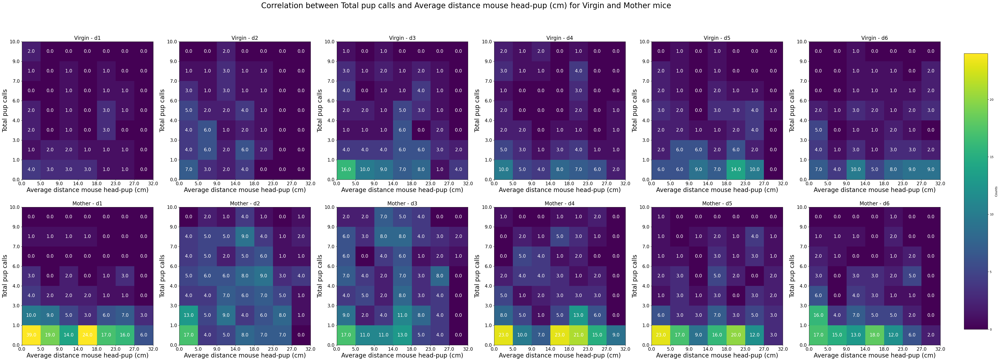

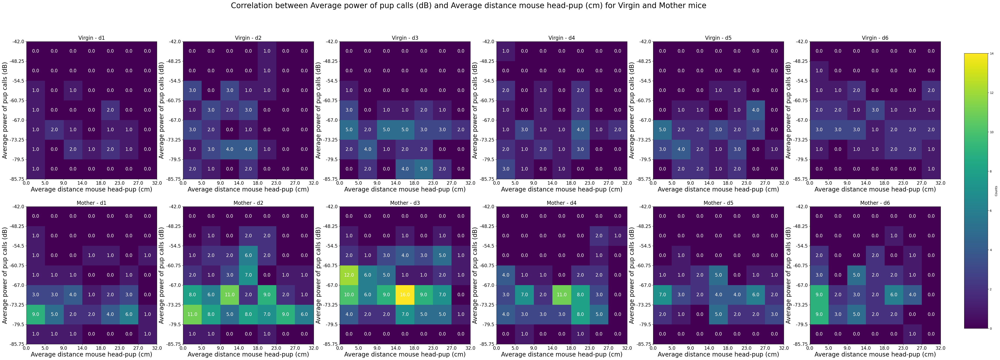

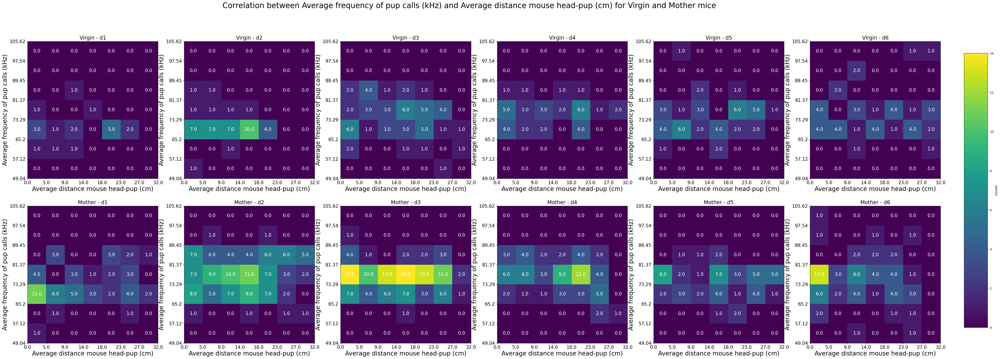

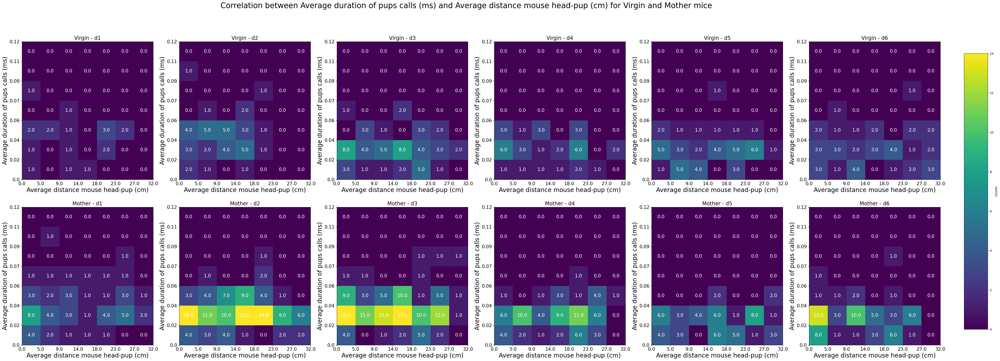

In [24]:
new_bounds = bounds.copy()
new_bounds["total_call_numbers"] = {"min": 0, "max": 10}

create_correlation_heatmaps(correlation_data, new_bounds,
                            label_y = "total_call_numbers",
                            label_x = "distance_head_to_pup_cm")

create_correlation_heatmaps(correlation_data, bounds,
                            label_y = "average_power",
                            label_x = "distance_head_to_pup_cm")

create_correlation_heatmaps(correlation_data, bounds,
                            label_y = "average_frequency",
                            label_x = "distance_head_to_pup_cm")

create_correlation_heatmaps(correlation_data, bounds,
                            label_y = "average_duration",
                            label_x = "distance_head_to_pup_cm")

#### Time-shifted correlation of pup calls VS distance to pup ####

Shifted for 1 bins (2 seconds)

Max on colorbar set to 42 counts.
Correlation for Virgin, d1 is 0.335
Correlation for Virgin, d2 is -0.132
Correlation for Virgin, d3 is 0.017
Correlation for Virgin, d4 is 0.065
Correlation for Virgin, d5 is 0.109
Correlation for Virgin, d6 is 0.24
Correlation for Mother, d1 is -0.024
Correlation for Mother, d2 is -0.013
Correlation for Mother, d3 is -0.065
Correlation for Mother, d4 is -0.084
Correlation for Mother, d5 is 0.114
Correlation for Mother, d6 is 0.089
Max on colorbar set to 21 counts.
Correlation for Virgin, d1 is 0.284
Correlation for Virgin, d2 is -0.036
Correlation for Virgin, d3 is 0.017
Correlation for Virgin, d4 is 0.185
Correlation for Virgin, d5 is 0.089
Correlation for Virgin, d6 is 0.099
Correlation for Mother, d1 is 0.092
Correlation for Mother, d2 is 0.147
Correlation for Mother, d3 is -0.013
Correlation for Mother, d4 is 0.144
Correlation for Mother, d5 is 0.13
Correlation for Mother, d6 is -0.018
Max on colorbar set to 21 counts.
Correlation for Virgin, d1 i

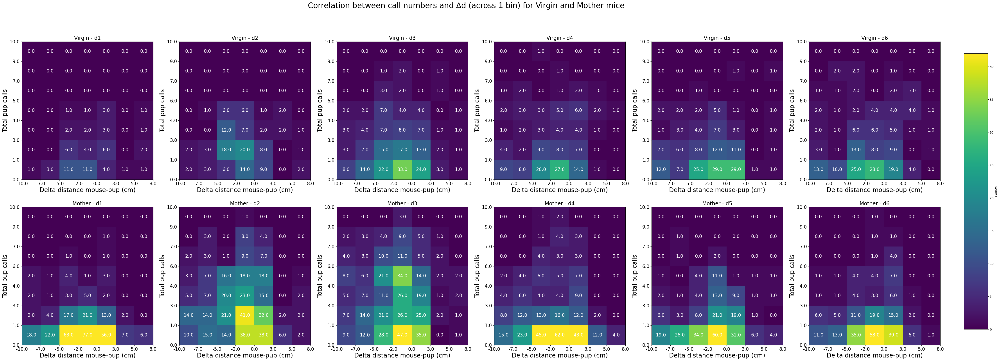

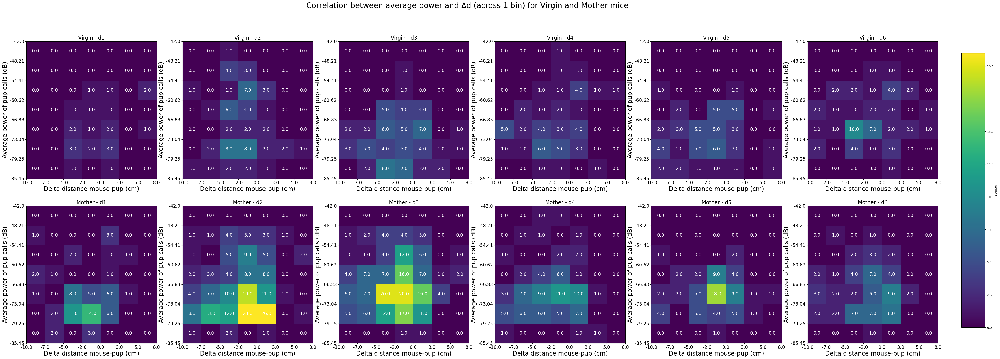

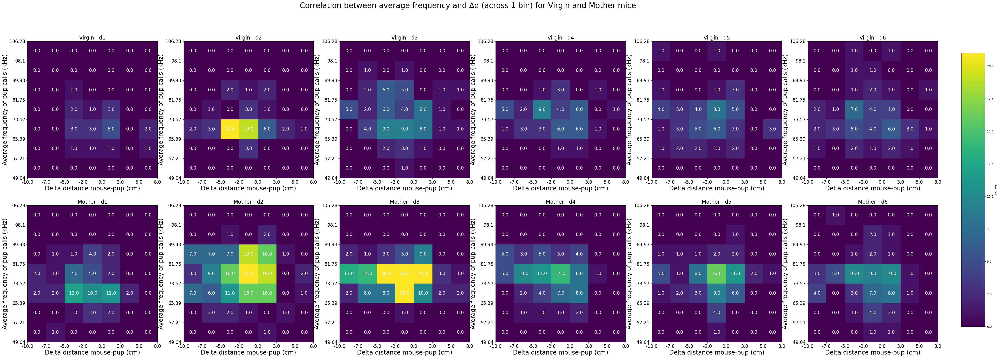

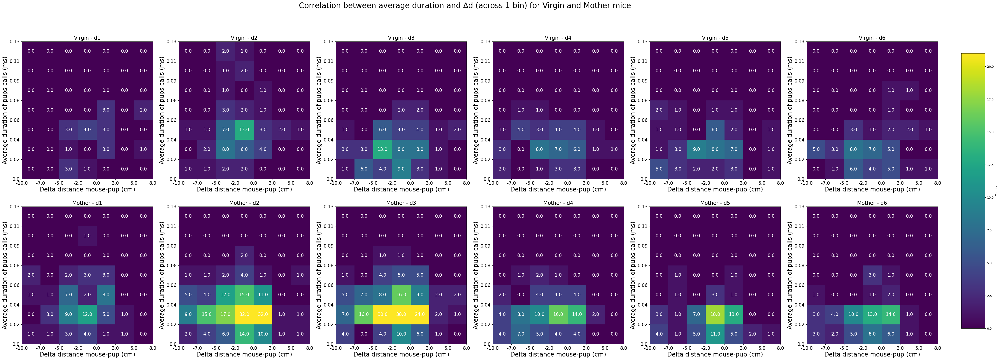

In [25]:
new_bounds = bounds_1bin.copy()
new_bounds["delta_distance"] = {"min": -10, "max": 8}
new_bounds["total_call_numbers"] = {"min": 0, "max": 10}

create_correlation_heatmaps(correlation_shift_1bin, new_bounds,
                            num_bins = 8,
                            title = "Correlation between call numbers and ∆d (across 1 bin) for Virgin and Mother mice",
                            label_y = "total_call_numbers",
                            label_x = "delta_distance")

create_correlation_heatmaps(correlation_shift_1bin, new_bounds,
                            num_bins = 8,
                            title = "Correlation between average power and ∆d (across 1 bin) for Virgin and Mother mice",
                            label_y = "average_power",
                            label_x = "delta_distance")

create_correlation_heatmaps(correlation_shift_1bin, new_bounds,
                            num_bins = 8,
                            title = "Correlation between average frequency and ∆d (across 1 bin) for Virgin and Mother mice",   
                            label_y = "average_frequency",
                            label_x = "delta_distance")

create_correlation_heatmaps(correlation_shift_1bin, new_bounds,
                            num_bins = 8,
                            title = "Correlation between average duration and ∆d (across 1 bin) for Virgin and Mother mice",
                            label_y = "average_duration",
                            label_x = "delta_distance")

2 bins shifted data

Max on colorbar set to 36 counts.
Correlation for Virgin, d1 is 0.366
Correlation for Virgin, d2 is -0.187
Correlation for Virgin, d3 is -0.066
Correlation for Virgin, d4 is 0.06
Correlation for Virgin, d5 is 0.157
Correlation for Virgin, d6 is 0.173
Correlation for Mother, d1 is -0.084
Correlation for Mother, d2 is -0.042
Correlation for Mother, d3 is -0.084
Correlation for Mother, d4 is -0.063
Correlation for Mother, d5 is 0.148
Correlation for Mother, d6 is 0.03


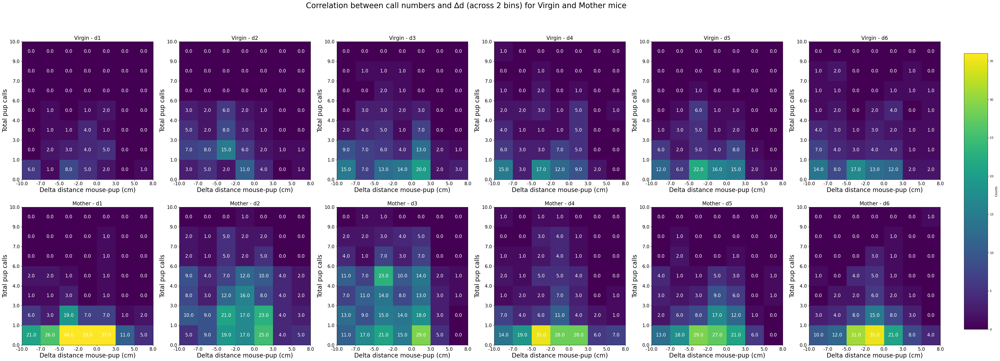

In [29]:
new_bounds_2bins = bounds_2bins.copy()
new_bounds_2bins["delta_distance"] = {"min": -10, "max": 8}
new_bounds_2bins["total_call_numbers"] = {"min": 0, "max": 10}

create_correlation_heatmaps(correlation_shift_2bins, new_bounds_2bins,
                            num_bins = 8,
                            title = "Correlation between call numbers and ∆d (across 2 bins) for Virgin and Mother mice",
                            label_y = "total_call_numbers",
                            label_x = "delta_distance")

3 bins shifted data

Max on colorbar set to 30 counts.
Correlation for Virgin, d1 is 0.277
Correlation for Virgin, d2 is -0.236
Correlation for Virgin, d3 is -0.069
Correlation for Virgin, d4 is -0.012
Correlation for Virgin, d5 is 0.123
Correlation for Virgin, d6 is 0.169
Correlation for Mother, d1 is -0.144
Correlation for Mother, d2 is -0.094
Correlation for Mother, d3 is -0.123
Correlation for Mother, d4 is -0.028
Correlation for Mother, d5 is 0.167
Correlation for Mother, d6 is -0.0


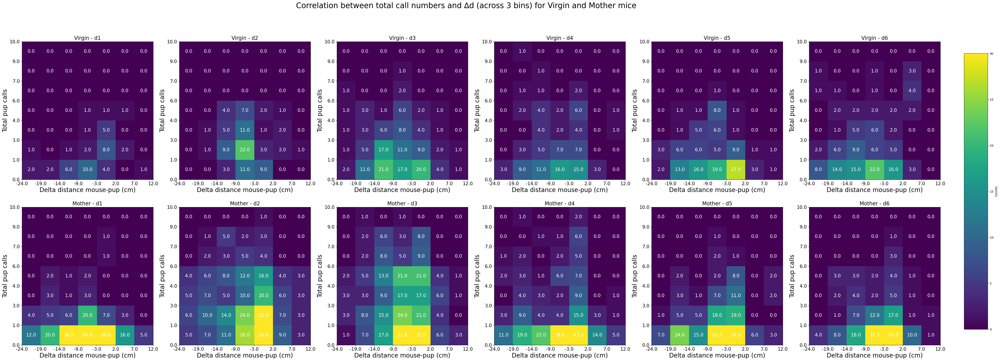

In [30]:
new_bounds_3bins = bounds_3bins.copy()
new_bounds_3bins["delta_distance"] = {"min": -24, "max": 12}
new_bounds_3bins["total_call_numbers"] = {"min": 0, "max": 10}

create_correlation_heatmaps(correlation_shift_3bins, new_bounds_3bins,
                            num_bins = 8,
                            title = "Correlation between total call numbers and ∆d (across 3 bins) for Virgin and Mother mice",
                            label_y = "total_call_numbers",
                            label_x = "delta_distance")